# Segmentacion Edad-Tema

El objetivo es encontrar que tan facil se puede segmentar la poblacion de los datos teniendo en cuenta tanto la edad como el tema de cada entrada del blog. Se va a utilizar codigo en Python con la biblioteca ``pandas`` para manipular los datos, y se utililzará ``altair`` para hacer las visualizaciones.

In [1]:
import altair as alt
import pandas as pd

# Altair plots render by default in JupyterLab and nteract
# Uncomment/run this line to enable Altair in the classic notebook (not in JupyterLab)
a= alt.renderers.enable('notebook')

blogs = pd.read_csv('blogtext.csv') # Importa los datos a un dataframe
blogs = blogs.drop_duplicates(['id'], keep='first') # Se remueven id duplicados para no contar la misma persona dos veces

## Distribución por tema

Una vez importados los datos y eliminados los registros con id repetidas, se hizo una lista con el tamaño de la poblacion correspondiente a cada tema.

In [2]:
total_tema = blogs.groupby(['topic']).size()
total_tema = total_tema.sort_values(ascending=True)
total_tema

topic
Maritime                     17
Environment                  28
InvestmentBanking            33
Agriculture                  36
Automotive                   54
RealEstate                   55
Museums-Libraries            55
Construction                 55
Biotech                      57
LawEnforcement-Security      57
Chemicals                    62
Architecture                 69
Manufacturing                87
Sports-Recreation            90
Transportation               91
HumanResources               94
Tourism                      94
Fashion                      98
Accounting                  105
Banking                     112
Military                    116
Telecommunications          119
Religion                    139
Advertising                 145
Publishing                  150
BusinessServices            163
Marketing                   180
Science                     184
Consulting                  191
Law                         197
Government                  236
En

Debido a las grandes diferencias entre las poblaciones, se separan en 3 grupos de tamaño de poblaciones similares.

In [3]:
i=0
grupo1 = blogs #
grupo2 = blogs #
grupo3 = blogs #

for tema in total_tema.index:
    i += 1
    if i > 28:
        grupo1 = (grupo1[grupo1['topic']!= tema])
    if i < 28 or i >38:
        grupo2 = (grupo2[grupo2['topic']!= tema])
    if i < 39:
        grupo3 = (grupo3[grupo3['topic']!= tema])

## Grafica 1

Esta grafica contiene a los grupos con poblaciones mas pequeñas. Se puede observar que la mayoria de las personas se encuentran ubicadas entre los 23 y 27 años, aunque hay casos especiales como por ejemplo, 'Fashion' o 'Sports-Recreation', que muestran una mayor concentracion cerca a los 17 años. Gracias a esta imagen es evidente el vacio de datos que existe entre 18 y 23 años y entre los 28 y 33, este se repite en todas las categorias.

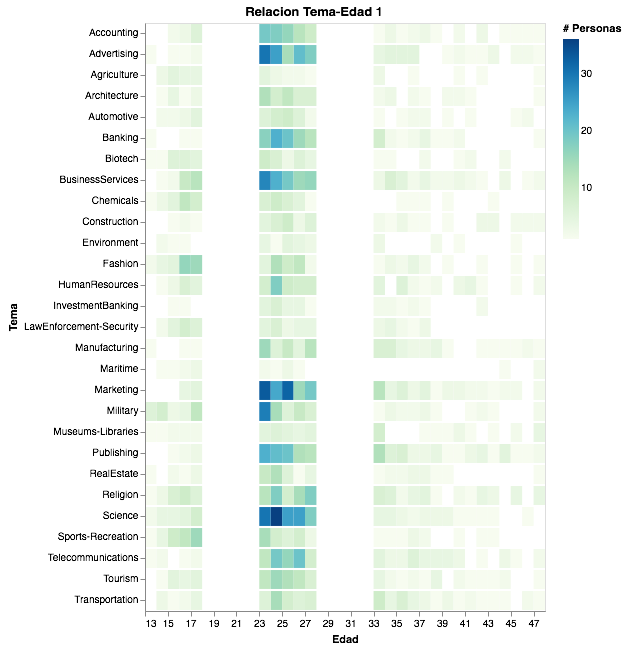

In [5]:
alt.data_transformers.enable('default', max_rows=None) #Seguro para graficas de altair

alt.Chart(grupo1,title='Relacion Tema-Edad 1').mark_rect().encode(
           x=alt.X('age', bin=alt.Bin(maxbins=50), title='Edad'),
           color=alt.Color('count(*):Q', scale=alt.Scale(scheme='greenblue'), title='# Personas'),
           y=alt.Y('topic', title='Tema')
           )

## Grafica 2

El segundo grupo muestra que la categoria 'Arts' es mucho mas atractiva para los adolecentes (hasta 18 años) que 'Tecnology', esto a pesar que la segunda tiene una poblacion mayor.

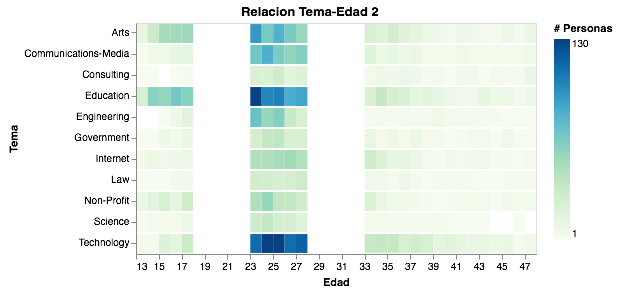

In [6]:
alt.data_transformers.enable('default', max_rows=None) #Seguro para graficas de altair
alt.Chart(grupo2,title='Relacion Tema-Edad 2').mark_rect().encode(
           x=alt.X('age', bin=alt.Bin(maxbins=50), title='Edad'),
           color=alt.Color('count(*):Q', scale=alt.Scale(scheme='greenblue'), title='# Personas'),
           y=alt.Y('topic', title='Tema')
           )

# La ultima grafica esta en el documento 'Analisis_edad_tema2.ipynb'

